# Chapitre 8 : Visualisation de données avec Matplotlib et Seaborn
Maîtrisez les techniques de visualisation des données financières à l’aide des puissantes bibliothèques de traçage de Python

##Objectifs d’apprentissage
- Créez des visualisations professionnelles des marchés financiers
- Élaborer des graphiques d’analyse interactifs des titres à revenu fixe
- Construire des tableaux de bord complets d’indicateurs économiques
- Maîtriser les techniques avancées de visualisation de l’analyse de marché

## Thèmes principaux
1. Visualisation des données de marché

C:\Users\wilfr\AppData\Local\Temp\ipykernel_49860\1183355840.py:6: FutureWarning: YF.download() has changed argument auto_adjust default to True
  stock = yf.download('AAPL', start='2023-01-01')
[*********************100%***********************]  1 of 1 completed


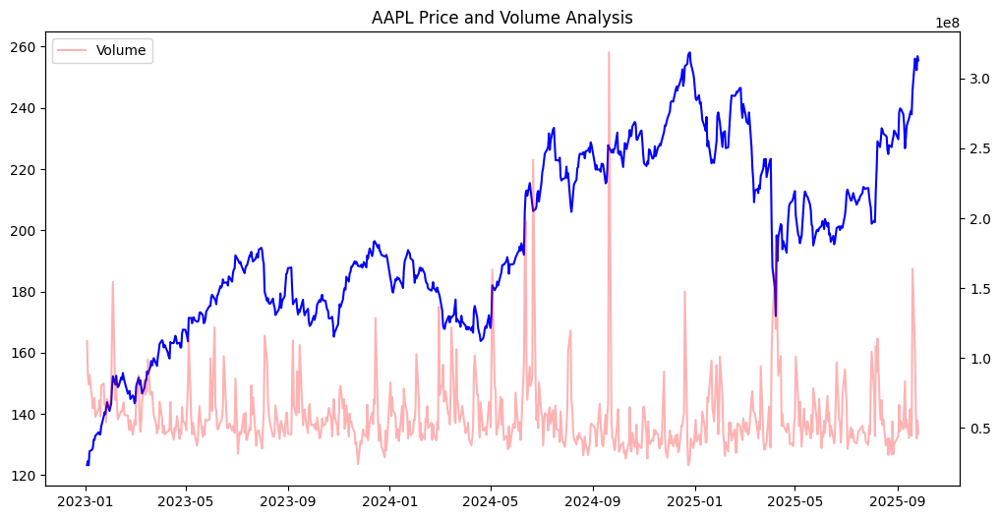

In [7]:
import matplotlib.pyplot as plt
import yfinance as yf
import seaborn as sns

# Download stock data
stock = yf.download('AAPL', start='2023-01-01')

# Create figure with secondary y-axis
fig, ax1 = plt.subplots(figsize=(12,6))
ax2 = ax1.twinx()

# Plot price and volume
ax1.plot(stock.index, stock['Close'], 'b-', label='Price')
ax2.plot(stock.index, stock['Volume'], alpha=0.3, color='red', label='Volume')

plt.title('AAPL Price and Volume Analysis')
plt.legend(loc='upper left')
plt.show()

- Analyse des prix et des volumes
- Modèles de chandeliers
- Graphiques OHLC
- Moyennes mobiles et indicateurs techniques

## 2. Indicateur d’inversion de la courbe des taux du Trésor et de récession
La courbe des taux s’inverse lorsque les taux à court terme deviennent plus élevés que les taux à long terme. Ceci est souvent considéré comme un signal d’alarme de récession.

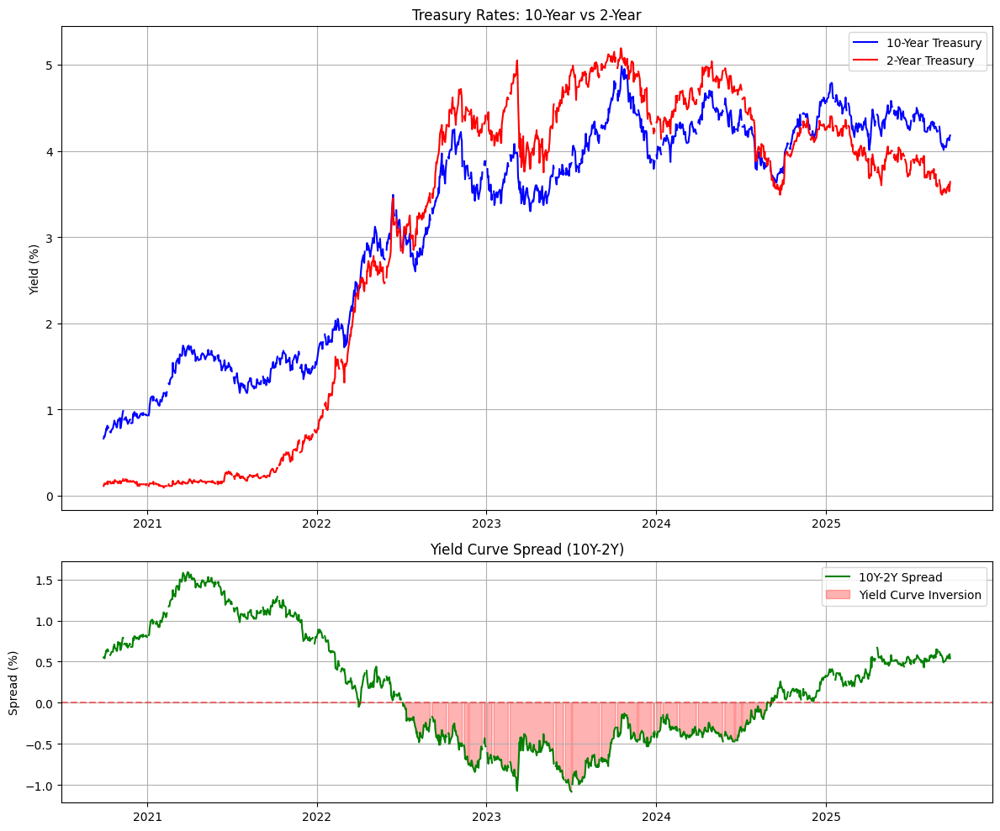

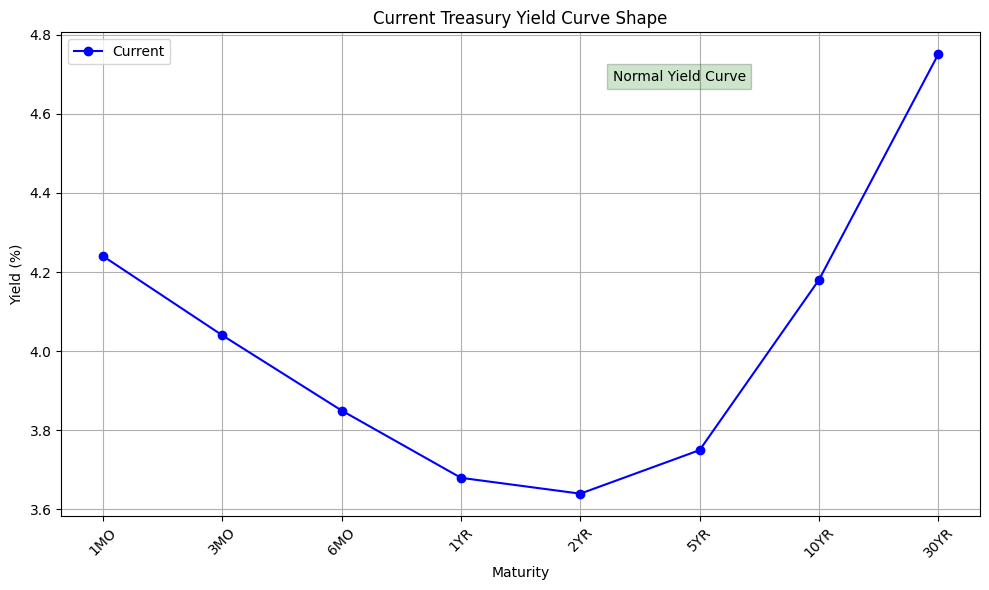

In [11]:
import pandas_datareader as pdr
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Get Treasury rates data from FRED
# 10-year minus 2-year spread is a common recession predictor
rates = pd.DataFrame()
rates['10YR'] = pdr.get_data_fred('DGS10')  # 10-year rate
rates['2YR'] = pdr.get_data_fred('DGS2')    # 2-year rate
rates['Spread'] = rates['10YR'] - rates['2YR']  # Yield curve spread

# Get recession data
recession = pdr.get_data_fred('USREC')

# Create figure with two subplots
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), height_ratios=[2, 1])

# Plot 1: Treasury Rates
ax1.plot(rates.index, rates['10YR'], 'b-', label='10-Year Treasury')
ax1.plot(rates.index, rates['2YR'], 'r-', label='2-Year Treasury')

# Highlight recession periods in both plots
for i in range(len(recession)-1):
    if recession['USREC'].iloc[i] == 1:
        ax1.axvspan(recession.index[i], recession.index[i+1], 
                   color='gray', alpha=0.2)
        ax2.axvspan(recession.index[i], recession.index[i+1], 
                   color='gray', alpha=0.2)

ax1.set_title('Treasury Rates: 10-Year vs 2-Year')
ax1.set_ylabel('Yield (%)')
ax1.grid(True)
ax1.legend()

# Plot 2: Yield Curve Spread
ax2.plot(rates.index, rates['Spread'], 'g-', label='10Y-2Y Spread')
ax2.axhline(y=0, color='r', linestyle='--', alpha=0.5)  # Add zero line
ax2.fill_between(rates.index, rates['Spread'], 0, 
                 where=(rates['Spread'] < 0),
                 color='r', alpha=0.3,
                 label='Yield Curve Inversion')

ax2.set_title('Yield Curve Spread (10Y-2Y)')
ax2.set_ylabel('Spread (%)')
ax2.grid(True)
ax2.legend()

plt.tight_layout()
plt.show()

# Let's also show a typical yield curve shape
# Get current Treasury rates for different maturities
maturities = ['1MO', '3MO', '6MO', '1YR', '2YR', '5YR', '10YR', '30YR']
tickers = ['DGS1MO', 'DGS3MO', 'DGS6MO', 'DGS1', 'DGS2', 'DGS5', 'DGS10', 'DGS30']
current_rates = pd.DataFrame()

for ticker in tickers:
    current_rates[ticker] = pdr.get_data_fred(ticker)

# Plot current yield curve
plt.figure(figsize=(10, 6))
plt.plot(range(len(maturities)), current_rates.iloc[-1], 'bo-', label='Current')

# Add labels
plt.title('Current Treasury Yield Curve Shape')
plt.xlabel('Maturity')
plt.ylabel('Yield (%)')
plt.xticks(range(len(maturities)), maturities, rotation=45)
plt.grid(True)

# Add annotation about curve shape
if current_rates.iloc[-1]['DGS2'] > current_rates.iloc[-1]['DGS10']:
    plt.text(0.6, 0.9, 'Inverted Yield Curve\n(Potential Recession Signal)', 
             transform=plt.gca().transAxes, 
             bbox=dict(facecolor='red', alpha=0.2))
else:
    plt.text(0.6, 0.9, 'Normal Yield Curve', 
             transform=plt.gca().transAxes, 
             bbox=dict(facecolor='green', alpha=0.2))

plt.legend()
plt.tight_layout()
plt.show()

- Comparaison des taux des bons du Trésor à 10 ans et à 2 ans
- Écart de la courbe des taux (10 ans-2 ans) comme indicateur de récession
- Visualisation des périodes d’inversion de la courbe des taux
- Forme actuelle de la courbe des taux avec interprétation

Comprendre les intrigues :
- Courbe de rendement normale : Les taux à long terme (10 ans) sont plus élevés que les taux à court terme (2 ans)
- Courbe de rendement inversée : taux à court terme plus élevés que les taux à long terme (spread négatif)
- Les zones grises montrent les périodes de récession historiques
- L’ombrage rouge indique les périodes d’inversion de la courbe des taux

## 3. Indicateurs économiques

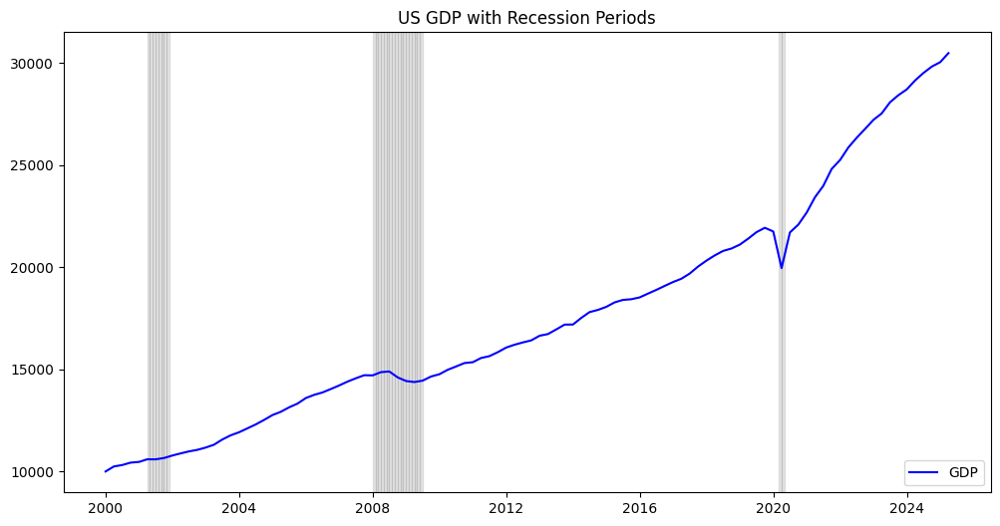

In [12]:
# Create recession highlighting
import pandas_datareader as pdr
from datetime import datetime

# Get GDP data
gdp = pdr.get_data_fred('GDP', start='2000-01-01')
recession = pdr.get_data_fred('USREC', start='2000-01-01')

# Plot GDP with recession highlighting
plt.figure(figsize=(12,6))
plt.plot(gdp.index, gdp['GDP'], 'b-', label='GDP')

# Highlight recession periods
for i in range(len(recession)):
    if recession['USREC'].iloc[i] == 1:
        plt.axvspan(recession.index[i], recession.index[i+1], 
                   color='gray', alpha=0.2)

plt.title('US GDP with Recession Periods')
plt.legend()
plt.show()

- Visualisation de la croissance du PIB
- Graphiques d’analyse de l’inflation
- Analyse de la période de récession
- Corrélations entre les indicateurs économiques

## 4. Analyse de marché avancée

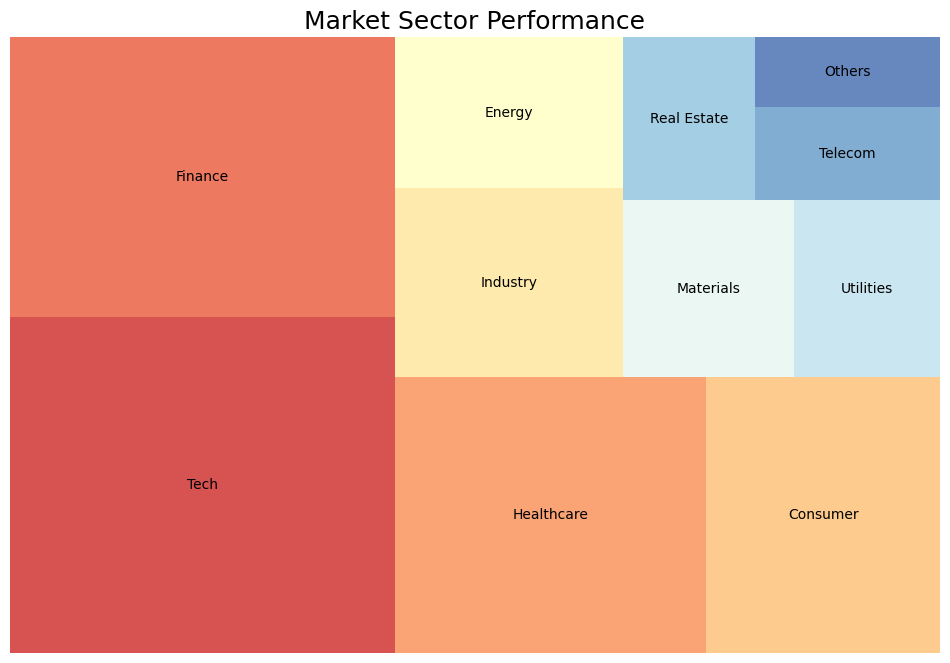

In [19]:
# Installer les packages si nécessaire
# pip install squarify seaborn matplotlib

import matplotlib.pyplot as plt
import squarify
import seaborn as sns

# Données cohérentes
sizes = [30, 25, 20, 15, 10, 8, 7, 6, 5, 4, 3]
labels = ['Tech', 'Finance', 'Healthcare', 'Consumer', 'Industry',
          'Energy', 'Materials', 'Utilities', 'Real Estate', 'Telecom', 'Others']

# Palette de couleurs
colors = sns.color_palette('RdYlBu', len(sizes))

# Création du treemap
plt.figure(figsize=(12,8))
squarify.plot(sizes=sizes, label=labels, color=colors, alpha=0.8)

plt.title('Market Sector Performance', fontsize=18)
plt.axis('off')  # Enlève les axes pour un rendu propre
plt.show()


## Exercices
### Exercices de base :
- Créer un graphique du cours de l’action avec le volume et les moyennes mobiles
- Tracer une courbe de rendement actuelle à l’aide des données du Trésor
- Visualisez les données sur l’inflation avec la mise en évidence de la récession
### Facultatif : Exercices intermédiaires :
-  Construire une animation de courbe de rendement montrant les changements au fil du temps
- Créer un tableau de bord d’analyse de la rotation des secteurs
- Développer un outil de visualisation de la sensibilité aux prix des obligations
### Facultatif : Exercices avancés :
- Créez un tableau de bord de marché complet combinant plusieurs indicateurs
- Construire un outil interactif d’analyse de la courbe des taux
- Développer un système de visualisation de l’étendue du marché en temps réel

## Solution

### Exercices de base
#### A: Cours de l’action avec volume et moyennes mobiles

- Nous allons récupérer les données d'Apple (AAPL) avec yfinance et tracer :

- Le cours de clôture

- Les moyennes mobiles (20 et 50 jours)

- Le volume sous forme d’histogramme

C:\Users\wilfr\AppData\Local\Temp\ipykernel_49860\3101193782.py:10: FutureWarning: YF.download() has changed argument auto_adjust default to True
  data = yf.download(ticker, start="2023-01-01", end="2025-09-01")
[*********************100%***********************]  1 of 1 completed


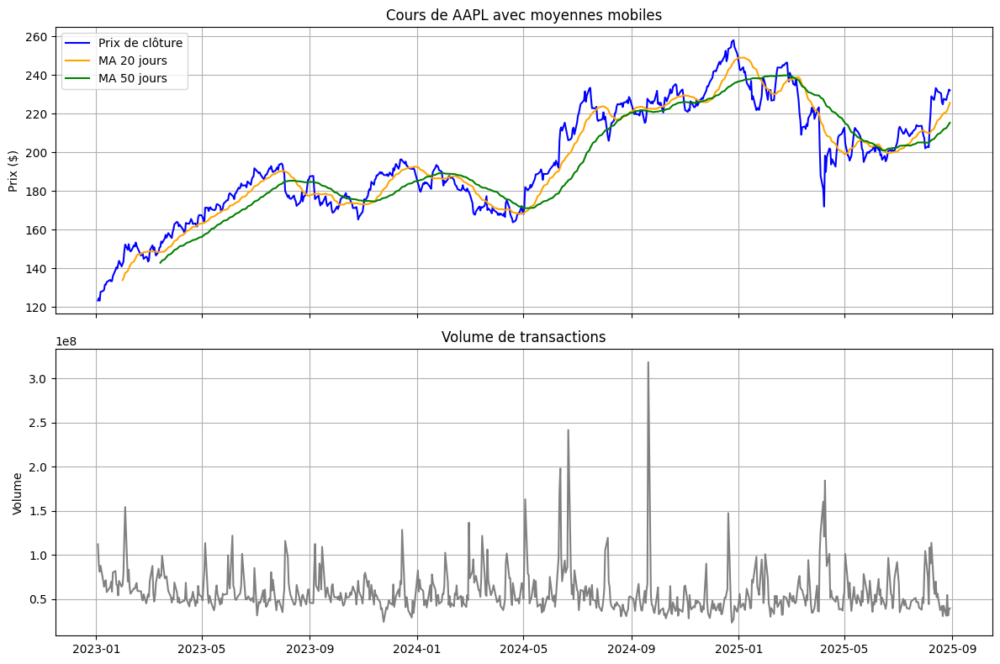

In [21]:
# Installer les bibliothèques si nécessaire
# pip install yfinance matplotlib pandas

import yfinance as yf
import matplotlib.pyplot as plt
import pandas as pd

# 1. Télécharger les données historiques
ticker = "AAPL"
data = yf.download(ticker, start="2023-01-01", end="2025-09-01")

# 2. Calculer les moyennes mobiles
data['MA20'] = data['Close'].rolling(window=20).mean()
data['MA50'] = data['Close'].rolling(window=50).mean()

# 3. Créer la figure
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12,8), sharex=True)

# ---- Prix et moyennes mobiles ----
ax1.plot(data.index, data['Close'], label='Prix de clôture', color='blue')
ax1.plot(data.index, data['MA20'], label='MA 20 jours', color='orange')
ax1.plot(data.index, data['MA50'], label='MA 50 jours', color='green')
ax1.set_title(f"Cours de {ticker} avec moyennes mobiles")
ax1.set_ylabel("Prix ($)")
ax1.legend()
ax1.grid(True)

# ---- Volume ----
ax2.plot(data.index, data['Volume'], color='gray')
ax2.set_title("Volume de transactions")
ax2.set_ylabel("Volume")
ax2.grid(True)

plt.tight_layout()
plt.show()


### Application financière :

- MA20 suit la tendance court terme,

- MA50 suit la tendance moyen terme.
- Quand MA20 croise MA50 → signal d'achat/vente.

### B : Courbe de rendement actuelle avec FRED

Objectif : visualiser la courbe des taux du Trésor américain.
Nous allons récupérer les taux d'obligations avec pandas_datareader.

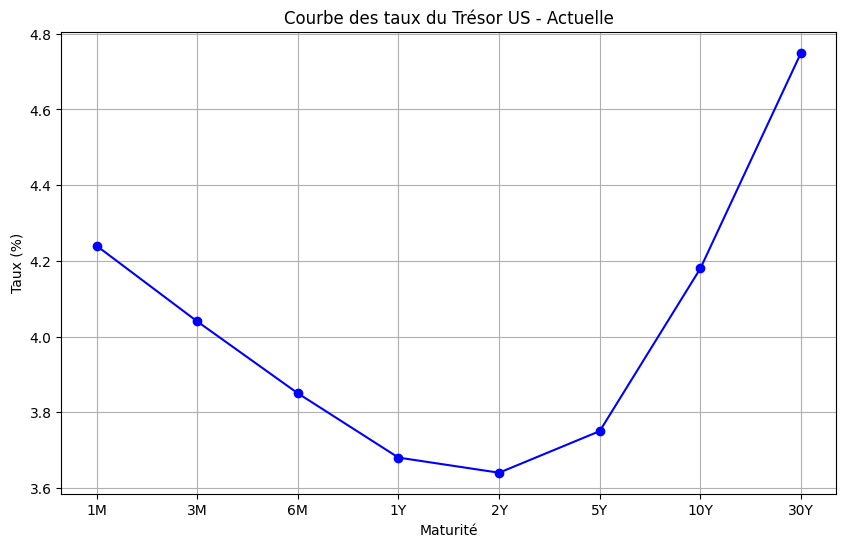

In [22]:
# pip install pandas_datareader

import pandas_datareader.data as web
import datetime
import matplotlib.pyplot as plt

# Période pour récupérer les données
today = datetime.datetime.today()

# Tickers FRED pour différents taux
tickers = {
    "1M": "DGS1MO",
    "3M": "DGS3MO",
    "6M": "DGS6MO",
    "1Y": "DGS1",
    "2Y": "DGS2",
    "5Y": "DGS5",
    "10Y": "DGS10",
    "30Y": "DGS30"
}

# Récupérer les taux
data = {}
for label, fred_code in tickers.items():
    df = web.DataReader(fred_code, "fred", today - datetime.timedelta(days=5), today)
    data[label] = df.iloc[-1, 0]  # Dernière valeur disponible

# Création graphique
plt.figure(figsize=(10,6))
plt.plot(list(data.keys()), list(data.values()), marker='o', color='blue')
plt.title("Courbe des taux du Trésor US - Actuelle")
plt.xlabel("Maturité")
plt.ylabel("Taux (%)")
plt.grid(True)
plt.show()


### C : Inflation avec récessions

Nous allons afficher le taux d'inflation avec des zones rouges pour marquer les périodes de récession.

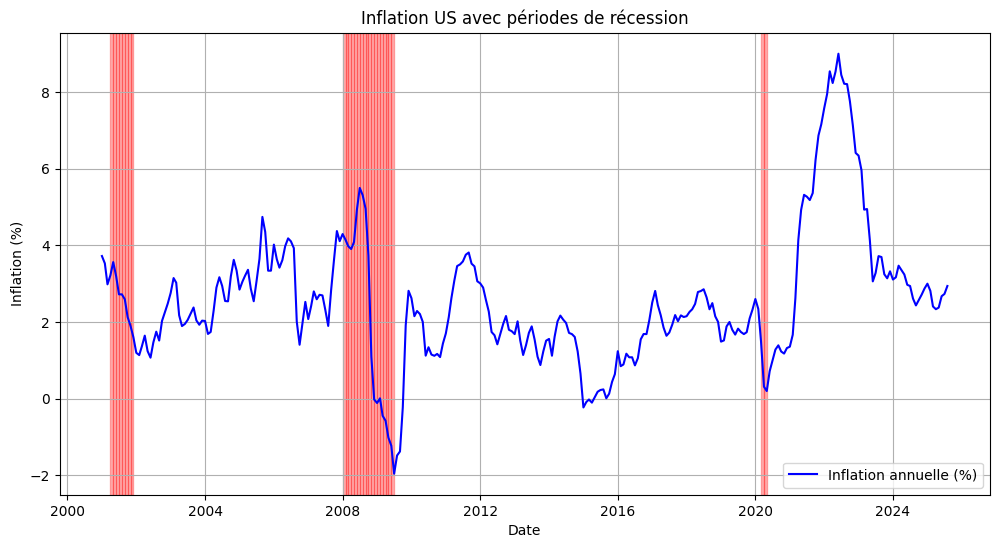

In [23]:
import pandas_datareader.data as web
import pandas as pd

# Récupérer le CPI (indice des prix à la consommation) et la série de récession US
start = datetime.datetime(2000,1,1)
end = datetime.datetime.today()

cpi = web.DataReader("CPIAUCSL", "fred", start, end)  # CPI
recession = web.DataReader("USREC", "fred", start, end)  # Récessions (0 ou 1)

# Calcul du taux d'inflation annuel
inflation = cpi.pct_change(periods=12) * 100

# Tracer l'inflation
plt.figure(figsize=(12,6))
plt.plot(inflation.index, inflation['CPIAUCSL'], label='Inflation annuelle (%)', color='blue')

# Mettre en évidence les récessions
for i in range(len(recession)-1):
    if recession['USREC'].iloc[i] == 1:
        plt.axvspan(recession.index[i], recession.index[i+1], color='red', alpha=0.3)

plt.title("Inflation US avec périodes de récession")
plt.xlabel("Date")
plt.ylabel("Inflation (%)")
plt.legend()
plt.grid(True)
plt.show()


### Exercices intermédiaires
A: Animation de la courbe des taux

Nous allons créer une animation montrant l'évolution des taux au fil du temps.

Nombre de dates retenues pour l'animation : 434
Frame 0 - Date 2024-01-02 00:00:00 - Rates [5.55 5.46 5.24 4.8  4.33 4.09 3.93 3.95 3.95 4.25 4.08]
Frame 0 - Date 2024-01-02 00:00:00 - Rates [5.55 5.46 5.24 4.8  4.33 4.09 3.93 3.95 3.95 4.25 4.08]
Frame 1 - Date 2024-01-03 00:00:00 - Rates [5.54 5.48 5.25 4.81 4.33 4.07 3.9  3.92 3.91 4.21 4.05]
Frame 2 - Date 2024-01-04 00:00:00 - Rates [5.56 5.48 5.25 4.85 4.38 4.14 3.97 3.99 3.99 4.3  4.13]


c:\Users\wilfr\AppData\Local\Programs\Python\Python311\Lib\site-packages\matplotlib\animation.py:892: UserWarning: Animation was deleted without rendering anything. This is most likely not intended. To prevent deletion, assign the Animation to a variable, e.g. `anim`, that exists until you output the Animation using `plt.show()` or `anim.save()`.
  warnings.warn(


Frame 3 - Date 2024-01-05 00:00:00 - Rates [5.54 5.47 5.24 4.84 4.4  4.17 4.02 4.04 4.05 4.37 4.21]
Frame 4 - Date 2024-01-08 00:00:00 - Rates [5.54 5.49 5.24 4.82 4.36 4.11 3.97 3.99 4.01 4.33 4.17]
Frame 5 - Date 2024-01-09 00:00:00 - Rates [5.53 5.47 5.24 4.82 4.36 4.09 3.97 4.   4.02 4.33 4.18]
Frame 6 - Date 2024-01-10 00:00:00 - Rates [5.53 5.46 5.23 4.82 4.37 4.1  3.99 4.01 4.04 4.35 4.2 ]
Frame 7 - Date 2024-01-11 00:00:00 - Rates [5.54 5.46 5.22 4.75 4.26 4.02 3.9  3.95 3.98 4.32 4.18]
Frame 8 - Date 2024-01-12 00:00:00 - Rates [5.55 5.45 5.16 4.65 4.14 3.92 3.84 3.91 3.96 4.32 4.2 ]
Frame 9 - Date 2024-01-16 00:00:00 - Rates [5.54 5.45 5.18 4.7  4.22 4.02 3.95 4.01 4.07 4.43 4.3 ]
Frame 10 - Date 2024-01-17 00:00:00 - Rates [5.54 5.47 5.2  4.8  4.34 4.12 4.02 4.07 4.1  4.42 4.31]
Frame 11 - Date 2024-01-18 00:00:00 - Rates [5.53 5.45 5.2  4.8  4.34 4.13 4.04 4.1  4.14 4.48 4.37]
Frame 12 - Date 2024-01-19 00:00:00 - Rates [5.54 5.45 5.21 4.84 4.39 4.18 4.08 4.12 4.15 4.47 4.3

Frame 0 - Date 2024-01-02 00:00:00 - Rates [5.55 5.46 5.24 4.8  4.33 4.09 3.93 3.95 3.95 4.25 4.08]


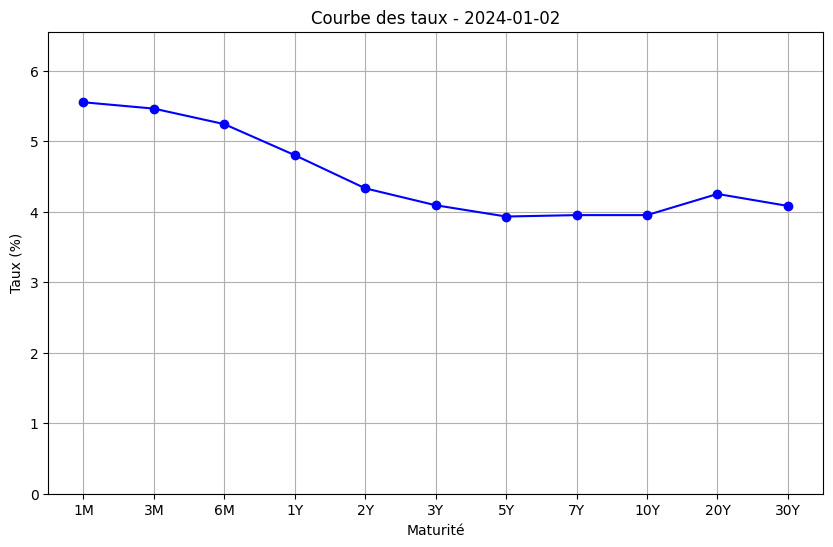

In [33]:
import datetime
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import pandas as pd
from pandas_datareader import data as web
from IPython.display import HTML

# 1. Config matplotlib pour Jupyter
# %matplotlib notebook  # Décommente si tu es dans un notebook
# %matplotlib widget    # Pour JupyterLab

# --- tickers des taux US (FRED) ---
tickers = {
    "1M": "DGS1MO",
    "3M": "DGS3MO",
    "6M": "DGS6MO",
    "1Y": "DGS1",
    "2Y": "DGS2",
    "3Y": "DGS3",
    "5Y": "DGS5",
    "7Y": "DGS7",
    "10Y": "DGS10",
    "20Y": "DGS20",
    "30Y": "DGS30"
}

start = datetime.datetime(2024, 1, 1)
today = datetime.datetime.today()

# --- Récupération des données ---
series_list = []
for label, fred_code in tickers.items():
    df = web.DataReader(fred_code, "fred", start, today)
    s = df.iloc[:, 0].rename(label)
    series_list.append(s)

df_all = pd.concat(series_list, axis=1).sort_index()

# Supprimer les dates avec NaN
plot_df = df_all.dropna(how='any')
print(f"Nombre de dates retenues pour l'animation : {len(plot_df)}")

dates = plot_df.index
labels = plot_df.columns.tolist()

# --- Animation ---
fig, ax = plt.subplots(figsize=(10, 6))

def animate(i):
    ax.clear()
    date = dates[i]
    rates = plot_df.iloc[i].values

    # Debug
    print(f"Frame {i} - Date {date} - Rates {rates}")

    ax.plot(range(len(labels)), rates, marker='o', color='blue')
    ax.set_xticks(range(len(labels)))
    ax.set_xticklabels(labels)
    ax.set_title(f"Courbe des taux - {date.strftime('%Y-%m-%d')}")
    ax.set_ylim(0, max(rates) + 1)
    ax.set_xlabel("Maturité")
    ax.set_ylabel("Taux (%)")
    ax.grid(True)

ani = animation.FuncAnimation(fig, animate, frames=len(dates), interval=200, blit=False)

# Affichage dans Jupyter
display(HTML(ani.to_jshtml()))

# Si tu veux sauvegarder en vidéo (nécessite ffmpeg)
# ani.save("yield_curve.mp4", dpi=150, fps=10)


### Dashboard rotation des secteurs

Nous allons utiliser un treemap pour visualiser la performance sectorielle.

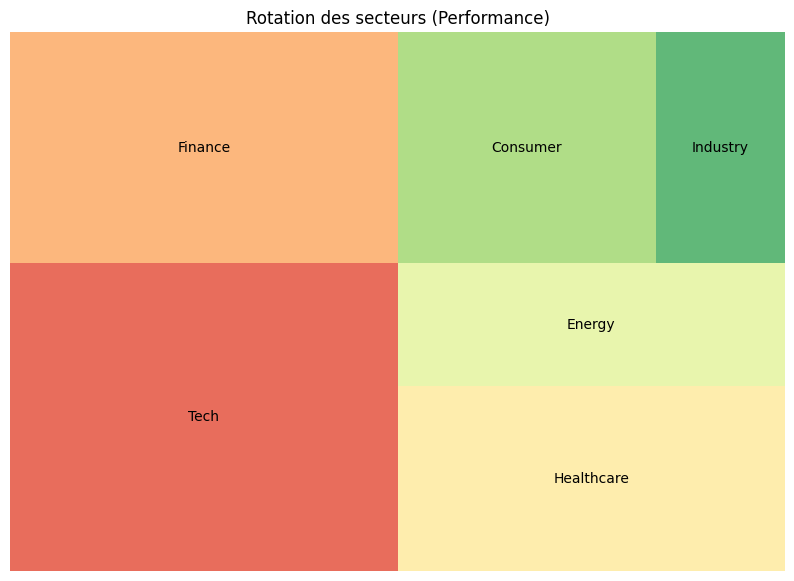

In [34]:
import squarify
import seaborn as sns

# Exemple de données fictives
sectors = ['Tech', 'Finance', 'Healthcare', 'Energy', 'Consumer', 'Industry']
performance = [20, 15, 12, 8, 10, 5]

# Couleurs
colors = sns.color_palette('RdYlGn', len(sectors))

plt.figure(figsize=(10,7))
squarify.plot(sizes=performance, label=sectors, color=colors, alpha=0.8)
plt.title("Rotation des secteurs (Performance)")
plt.axis('off')
plt.show()


### Sensibilité des obligations (Duration)

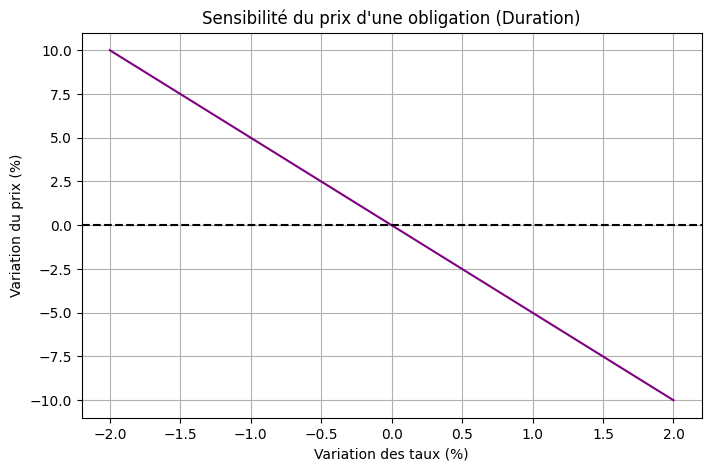

In [35]:
import numpy as np

# Paramètres
duration = 5  # sensibilité
yield_change = np.linspace(-0.02, 0.02, 50)  # variation de taux (-2% à +2%)

# Variation du prix
price_change = -duration * yield_change * 100  # approximation linéaire

plt.figure(figsize=(8,5))
plt.plot(yield_change*100, price_change, color='purple')
plt.axhline(0, color='black', linestyle='--')
plt.title("Sensibilité du prix d'une obligation (Duration)")
plt.xlabel("Variation des taux (%)")
plt.ylabel("Variation du prix (%)")
plt.grid(True)
plt.show()


### Exercices avancés
#### Tableau de bord complet

Combine :

- Actions

- Courbe des taux

- Inflation

Rotation sectorielle

📌 Ici, on utilisera matplotlib avec plusieurs sous-graphiques (plt.subplots).

In [36]:
"""
app.py - Tableau de bord financier interactif simple en Dash/Plotly.

Fonctionnalités :
- Section Actions : prix, volume, moyennes mobiles (MA courte/longue).
- Section Courbe des taux : sélectionner une date et afficher la courbe (FRED).
- Section Inflation : inflation annuelle + mise en évidence des récessions (FRED).
- Section Rotation sectorielle : treemap interactif (données d'exemple).
"""

import datetime
import pandas as pd
import numpy as np
import yfinance as yf
import pandas_datareader.data as web

import plotly.graph_objects as go
import plotly.express as px

from dash import Dash, dcc, html, Input, Output

# ---------------------
# Fonctions utilitaires
# ---------------------

def fetch_stock_data(ticker: str, start: str, end: str) -> pd.DataFrame:
    """Récupère les données historiques d'un ticker via yfinance."""
    # yfinance retourne un DataFrame avec Open/High/Low/Close/Adj Close/Volume
    df = yf.download(ticker, start=start, end=end, progress=False)
    if df.empty:
        # retourne DataFrame vide avec index pour éviter crash dans plotting
        return pd.DataFrame(columns=['Open','High','Low','Close','Adj Close','Volume'])
    df.index = pd.to_datetime(df.index)
    return df

def compute_moving_averages(df: pd.DataFrame, ma_short: int, ma_long: int) -> pd.DataFrame:
    """Ajoute MA courte et MA longue au DataFrame."""
    if df.empty:
        return df
    df = df.copy()
    df[f"MA{ma_short}"] = df['Close'].rolling(window=ma_short, min_periods=1).mean()
    df[f"MA{ma_long}"] = df['Close'].rolling(window=ma_long, min_periods=1).mean()
    return df

def fetch_yield_curve(date: datetime.date, tickers_map: dict) -> pd.Series:
    """Récupère les derniers rendements disponibles pour la date demandée via FRED.
       Si la date n'a pas de données complètes, renvoie les dernières valeurs disponibles précédant la date."""
    rates = {}
    for label, code in tickers_map.items():
        try:
            s = web.DataReader(code, "fred", date - datetime.timedelta(days=30), date)
            # prendre la dernière valeur non-NA
            val = s.dropna().iloc[-1, 0] if not s.dropna().empty else np.nan
        except Exception:
            val = np.nan
        rates[label] = val
    return pd.Series(rates)

def fetch_inflation_and_recessions(start: str, end: str):
    """Retourne inflation annuelle (CPI) et la série USREC (0/1 récession)."""
    cpi = web.DataReader("CPIAUCSL", "fred", start, end)
    # pct_change(12) -> inflation annuelle
    inflation = cpi.pct_change(periods=12) * 100
    recession = web.DataReader("USREC", "fred", start, end)  # 1 = récession, 0 = pas
    return inflation, recession

# ---------------------
# Paramètres & constantes
# ---------------------

DEFAULT_TICKER = "AAPL"
START_DATE = "2018-01-01"
END_DATE = (datetime.datetime.today() + datetime.timedelta(days=1)).strftime("%Y-%m-%d")

YIELD_TICKERS = {
    "1M": "DGS1MO",
    "3M": "DGS3MO",
    "6M": "DGS6MO",
    "1Y": "DGS1",
    "2Y": "DGS2",
    "5Y": "DGS5",
    "10Y": "DGS10",
    "30Y": "DGS30",
}

# Données de secteur (exemple). Dans un vrai workflow on remplacerait par des données réelles.
SECTOR_NAMES = ['Tech', 'Finance', 'Healthcare', 'Consumer', 'Industry', 'Energy', 'Materials', 'Utilities']
SECTOR_PERFORMANCE = [18, 10, 12, 8, 6, -4, 3, 2]  # en % (exemple)

# ---------------------
# Initialisation app Dash
# ---------------------

app = Dash(__name__)
server = app.server  # pour déploiement éventuel

# Layout (structure) du dashboard
app.layout = html.Div([
    html.H1("Tableau de bord financier (exemple)", style={"textAlign": "center"}),
    html.Div([
        # ---- Colonne gauche : contrôle actions ----
        html.Div([
            html.H3("Actions"),
            html.Label("Ticker"),
            dcc.Dropdown(
                id="ticker-dropdown",
                options=[{"label": t, "value": t} for t in ["AAPL","MSFT","GOOGL","AMZN","TSLA","SPY"]],
                value=DEFAULT_TICKER,
                clearable=False
            ),
            html.Br(),
            html.Label("Intervalle des moyennes mobiles (jours)"),
            html.Div([
                html.Label("MA courte"),
                dcc.Slider(id="ma-short", min=5, max=50, step=1, value=20,
                           marks={5:"5", 20:"20", 50:"50"}),
                html.Label("MA longue"),
                dcc.Slider(id="ma-long", min=20, max=200, step=1, value=50,
                           marks={50:"50", 100:"100", 200:"200"}),
            ]),
            html.Br(),
            dcc.Graph(id="stock-graph"),
            html.Br(),
        ], style={"width":"48%", "display":"inline-block", "verticalAlign":"top", "padding":"10px"}),

        # ---- Colonne droite : yield curve & inflation ----
        html.Div([
            html.H3("Courbe des taux (Trésor US)"),
            html.Label("Date (sélectionne la date de la courbe)"),
            dcc.DatePickerSingle(
                id="yield-date",
                min_date_allowed=datetime.date(1990,1,1),
                max_date_allowed=datetime.date.today(),
                date=datetime.date.today()
            ),
            dcc.Graph(id="yield-curve-graph"),

            html.H3("Inflation annuelle & récessions"),
            dcc.Graph(id="inflation-graph"),
        ], style={"width":"50%", "display":"inline-block", "padding":"10px", "verticalAlign":"top"}),
    ], style={"display":"flex", "justifyContent":"space-between"}),

    html.Hr(),

    html.Div([
        # ---- Rotation sectorielle ----
        html.Div([
            html.H3("Rotation sectorielle (treemap d'exemple)"),
            dcc.Graph(id="sector-treemap"),
        ], style={"width":"48%", "display":"inline-block", "verticalAlign":"top", "padding":"10px"}),

        # ---- Sensibilité obligations (Duration) ----
        html.Div([
            html.H3("Sensibilité obligations - Variation de prix vs variation des taux"),
            html.Label("Duration (approx.)"),
            dcc.Slider(id="duration-slider", min=1, max=15, step=0.5, value=5,
                       marks={1:"1", 5:"5", 10:"10", 15:"15"}),
            dcc.Graph(id="duration-graph"),
        ], style={"width":"48%", "display":"inline-block", "padding":"10px"}),
    ], style={"display":"flex", "justifyContent":"space-between"}),

    html.Div(style={"height":"40px"}),  # espace
    html.Footer("Exemple pédagogique - Données en direct via yfinance & FRED", style={"textAlign":"center", "color":"gray"})
])

# ---------------------
# Callbacks - logique interactive
# ---------------------

@app.callback(
    Output("stock-graph", "figure"),
    Input("ticker-dropdown", "value"),
    Input("ma-short", "value"),
    Input("ma-long", "value"),
)
def update_stock_graph(ticker, ma_short, ma_long):
    """Met à jour le graphique de prix + volume + moyennes mobiles pour le ticker sélectionné."""
    # 1) Récupérer données
    df = fetch_stock_data(ticker, START_DATE, END_DATE)
    df = compute_moving_averages(df, ma_short, ma_long)

    # 2) Construire figure Plotly avec 2 axes y (prix et volume)
    fig = go.Figure()

    # Prix de clôture
    if not df.empty:
        fig.add_trace(go.Scatter(x=df.index, y=df['Close'], mode='lines', name=f"{ticker} Close"))
        # MAs
        fig.add_trace(go.Scatter(x=df.index, y=df.get(f"MA{ma_short}", []), mode='lines', name=f"MA{ma_short}"))
        fig.add_trace(go.Scatter(x=df.index, y=df.get(f"MA{ma_long}", []), mode='lines', name=f"MA{ma_long}"))

        # Volume (barres) sur y secondaire
        fig.add_trace(go.Bar(x=df.index, y=df['Volume'], name="Volume",
                             marker=dict(opacity=0.4), yaxis="y2"))

    # Layout axes
    fig.update_layout(
        title=f"{ticker} - Prix & Volume",
        xaxis=dict(rangeslider=dict(visible=True)),  # range slider pour navigation
        yaxis=dict(title="Prix ($)"),
        yaxis2=dict(title="Volume", overlaying="y", side="right", showgrid=False, position=1.0),
        legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1)
    )
    return fig

@app.callback(
    Output("yield-curve-graph", "figure"),
    Input("yield-date", "date")
)
def update_yield_curve_graph(date):
    """Afficher la courbe des taux pour la date sélectionnée."""
    if date is None:
        date = datetime.date.today()
    else:
        date = pd.to_datetime(date).date()

    series = fetch_yield_curve(date, YIELD_TICKERS)
    maturities = list(series.index)
    rates = series.values

    # Préparer un DataFrame propre
    df = pd.DataFrame({"Maturity": maturities, "Rate": rates})
    df = df.dropna()  # enlever maturités sans données

    fig = go.Figure()
    fig.add_trace(go.Scatter(x=df['Maturity'], y=df['Rate'], mode='lines+markers', name=f"Yield {date}"))
    fig.update_layout(title=f"Courbe des taux - {date}", xaxis_title="Maturité", yaxis_title="Taux (%)")
    return fig

@app.callback(
    Output("inflation-graph", "figure"),
    Input("yield-date", "date")  # on lie à la même date juste pour rafraîchir si besoin
)
def update_inflation_graph(_):
    """Tracer l'inflation annuelle et mettre en évidence les périodes de récession (USREC)."""
    # Période large (20 ans) pour contexte
    start = "2000-01-01"
    end = datetime.date.today().strftime("%Y-%m-%d")
    inflation, recession = fetch_inflation_and_recessions(start, end)

    # Nettoyage
    inflation = inflation.dropna()
    recession = recession.reindex(inflation.index).fillna(0)

    fig = go.Figure()
    fig.add_trace(go.Scatter(x=inflation.index, y=inflation['CPIAUCSL'], mode='lines', name='Inflation annuelle (%)'))

    # Ajout des périodes de récession en background
    # USREC vaut 1 pendant la récession, on détecte les périodes continues
    rec = recession['USREC']
    in_rec = False
    rec_start = None
    for dt, val in rec.iteritems():
        if val == 1 and not in_rec:
            in_rec = True
            rec_start = dt
        if val == 0 and in_rec:
            # fin de récession
            fig.add_vrect(x0=rec_start, x1=dt, fillcolor="red", opacity=0.2, line_width=0)
            in_rec = False
            rec_start = None
    # si la série finit dans une récession, on l'ajoute jusqu'à la dernière date
    if in_rec and rec_start is not None:
        fig.add_vrect(x0=rec_start, x1=inflation.index[-1], fillcolor="red", opacity=0.2, line_width=0)

    fig.update_layout(title="Inflation annuelle (CPI) avec périodes de récession (USREC)",
                      xaxis_title="Date", yaxis_title="Inflation (%)")
    return fig

@app.callback(
    Output("sector-treemap", "figure"),
    Input("ticker-dropdown", "value")  # input inutile mais permet rafraîchir si ticker change
)
def update_sector_treemap(_):
    """Treemap représentant la performance sectorielle (données d'exemple)."""
    df = pd.DataFrame({
        "sector": SECTOR_NAMES,
        "performance": SECTOR_PERFORMANCE
    })
    # Couleurs selon la performance
    fig = px.treemap(df, path=['sector'], values='performance',
                     color='performance', color_continuous_scale='RdYlGn',
                     title="Performance sectorielle (exemple)")
    return fig

@app.callback(
    Output("duration-graph", "figure"),
    Input("duration-slider", "value")
)
def update_duration_graph(duration):
    """Visualise l'approximation linéaire de la sensibilité du prix d'une obligation (duration)."""
    # Variation des taux en points (ex: -2% à +2%)
    yield_change = np.linspace(-0.03, 0.03, 201)  # -3% à +3%
    price_change_pct = -duration * yield_change * 100  # approx. : % change ≈ -duration * Δy * 100

    fig = go.Figure()
    fig.add_trace(go.Scatter(x=yield_change*100, y=price_change_pct, mode='lines', name='ΔPrix (%)'))
    fig.add_trace(go.Scatter(x=[0], y=[0], mode='markers', marker=dict(color='black'), showlegend=False))
    fig.update_layout(title=f"Sensibilité prix - Duration approx. = {duration}",
                      xaxis_title="Variation du taux (%)",
                      yaxis_title="Variation approximative du prix (%)")
    return fig

# ---------------------
# Run server
# ---------------------
if __name__ == "__main__":
    app.run_server(debug=True)
